# Convolution

Convolution is a useful mathematical tool operating on two functions. There are many applications in signal processing, probability & statistics, image processing, computer vision, and more that utilize the convolution.  

Formally, a convolution between any two functions $f$ and $g$ is defined as the following operation:  

$$(f*g)(t) = \int_{-\infty}^{\infty} f(\tau)g(t - \tau)d\tau$$

#### Important Properties
\begin{align}
    &\text{Commutativity: }\quad\quad\quad\quad\quad f*g = g*f \\
    &\text{Associativity: }\quad\quad\quad\quad\quad\;\;\ f*(g*h) = (f*g)*h \\
    &\text{Linearity: }\quad\quad\quad\quad\quad\quad\quad f*(\alpha g + \beta h) = \alpha(f*g) + \beta(f* h) \\
    &\text{Multiplicative Identity: }\quad\quad\; f * \delta = f \\
    &\text{Translation Equivariance: }\quad\ T(f*g) = (Tf)*g = f*(Tg)
\end{align}

#### Convolution vs. Cross-Correlation

A similar operation to convolution is called [cross correlation](https://en.wikipedia.org/wiki/Cross-correlation) which can be thought of as a measure of similiarity between two signals (this will become more apparent when we discuss 2D convolution). The definition of the cross correlation operation is defined as the following:

$$(f \star g)(t) = \int_{-\infty}^{\infty} f(\tau)g(\tau - t)d\tau$$

The *only* difference between the two operations is that the signal $g$ is reversed before computation in convolution (this can be seen directly from the definition).

# Discrete Convolution

This notebook will focus on the convolution of signals indexed in discrete space or time, because these are the signals that we can actually measure and work with on a computer - even when the physical signal lives in a continuous domain (e.g. sensor measurements of the local air pressure).

In [1]:
# import libraries
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from PIL import Image
from IPython import display
from filters import *

# 1D Convolution

The convolution of two 1D signals $f$ and $g$ is defined as:

\begin{align*}
    (f*g)[n] = \sum_{k=-\infty}^\infty f[k]g[n-k]
\end{align*}

For physical signals, the bounds on the summation are not actually $-\infty$ to $\infty$, plus an infinite summation is not computationally tractable. The sum is really defined over where the signals themselves are defined.

Intuitively, the convolution can be seen as sliding one signal against another and computing the dot product everywhere the two signals intersect. 

From the equation above, the size of $n$ is actually a choice made by the user since we can compute the convolution anywhere (even $n = \infty$) by *padding* the signals for points outside of the original domain with zeros or any arbitrary padding value.

For now, let $n$ be the number of samples you get by convolving the two inputs signals starting with the first element of $f$ lined up with the last element of $g$, and ending with the last element of $f$ lining up with the first element of $g$.

#### Intuition
An interesting question to ask is what is convolution *actually* doing? From a signals processing perspective, convolution is the response of a [linear time-invariant](https://brilliant.org/wiki/linear-time-invariant-systems/) (LTI) system to a signal. In this context, convolution is usually written as:

\begin{align*}
    (x*h)[n] = \sum_{k=-\infty}^\infty x[k]h[n-k]
\end{align*}

Where $x$ is a signal and $h$ is called the *impulse response function* which describes how an LTI system responds to a unit impulse (think about an impulse as a sudden 'kick' to a system).

![](https://cnx.org/resources/37ae31f3b7a37ab502ab933968993acddc18f7c4/impulse.PNG)
<p style="text-align: center;">Figure 1: Unit impulse response</p>

The symbol $\delta$ is the Dirac delta function which is defined as:

\begin{align*}
    \delta(x) = 
    \begin{cases} 
      0 \;\;\quad\text{x $\ne$ 0} \\
      \infty \;\quad\text{x = 0} 
    \end{cases}
\end{align*}

An important fundamental property of the Dirac delta is the *sifting property* which states:

\begin{align*}
    \int_{-\infty}^{\infty} f(x)\delta(x - a)dx = f(a)
\end{align*}

That is, the Dirac delta 'picks' or 'sifts' the value of the function at only $a$ when you integrate over it. This also applies in the discrete case with a summation.

![](https://sciencenotes.org/wp-content/uploads/2014/07/friction3.png)
<p style="text-align: center;">Figure 2: Block on a surface with friction</p>

To build intuition, consider the following example: Suppose you want to model the dynamics of a block sliding along an abrasive surface (Figure 2). We can represent the unit impulse response as the velocity resulting from a sudden push on the block which will eventually decay to zero due to the friction from the surface. The signal $x$ can represent the force we apply to the block over time. Using the sifting property of the Dirac delta and the definition of 1D  discrete convolution, notice that we can write the signal $x$ at time $t$ as follows:

\begin{align*}
    x[t] = \sum_\tau x[\tau] \delta[\tau - t]
\end{align*}

The dynamics (the velocity) is encoded in some response operator we'll call $H$ which will tell us how the system responds to a signal. We already know that the system should respond to the unit impulse signal $\delta$ with $h$. Let's use this to see how the system responds to the force signal at time $t$:

\begin{align*}
    H\{x[t]\} &= H\{\sum_\tau x[\tau] \delta[\tau - t]\} \\
            &= \sum_\tau x[\tau] H\{\delta[\tau - t]\} \\
            &= \sum_\tau x[\tau] h[\tau - t] \\
            &= (x * h)[t]
\end{align*}

An interesting observation of this example is that when multiply $x$ with $h$ and the timestep $dt = 1$ (which is not explicitly written), the units come out as joules. In this case, this means that the convolution of the driving force $x$ and the velocity response $h$ gives us the energy of the system over time!

In [197]:
def convolution_1d(f, g):
    """Computes a 1D discrete convolution over two signals f and g
    
    Args:
        f (np.array): one of the signals
        g (np.array): the other signal
    """
    # compute padding
    padding = len(g) - 1
    
    # compute output shape
    length = len(f) - len(g) + 2 * padding + 1
    
    # pad input signals
    f_pad, g_pad = np.zeros((2, length))
    f_pad[:len(f)] = f
    g_pad[length - len(g):] = g[::-1]
    
    output = np.zeros(length)
    
    # iterate through each timestep
    for i in range(length):
        
        # perform dot product
        output[i] = f_pad[:i + 1] @ g_pad[-(i + 1):]
    
    return output    

In [265]:
def plot_convolution(f, g, response, filepath):
    """Plots gif of convolution output over each timestep
    
    WARNING: This function can be very taxing on your computer
    
    Args:
        f (np.array): one of the signals
        g (np.array): the other signal
        response (np.array): convolution output of f and g
        filepath (string): filepath for saving the gif file
    """
    fig, axes = plt.subplots(3, 1, sharex=True, figsize=(12, 8))
    
    # plot appearance
    fig.suptitle("Convolution of $f$ and $g$", size=20, y=0.95)
    for i, label in enumerate(("$f$", "$g$", "$f*g$")):
        axes[i].set_ylabel(label, size=15)
        axes[i].set_xlim(0, len(response))
        axes[i].set_xlim(0, len(response))
    axes[-1].set_xlabel("t")
    
    # pad input signals
    length = len(response)
    x = range(length)
    f_rem = length - len(f)
    g_rem = length - len(g)
    
    f_padding = (0, f_rem)
    g_padding = (g_rem, 0)
    
    f_pad = np.pad(f, f_padding)
    g_pad = np.pad(g[::-1], g_padding)
    
    # init animation
    f_line, = axes[0].plot(x, f_pad)
    g_line, = axes[1].plot(x, np.zeros(length))
    fg_line, = axes[-1].plot(x, np.zeros(length))
    lines = [f_line, g_line, fg_line]
    
    # plot convolution
    def animate(i):
        
        # translate g to the right for the gif animation
        g_subset = g_pad[-(i + 1):]
        if length - len(g_subset) >= 0:
            g_subset = np.pad(g_subset, (0, length - len(g_subset)))
        else:
            g_subset = g_subset[:length]
        lines[1].set_data(x, g_subset)
        
        # plot the response
        r_subset = response[:(i + 1)]
        r_padded = np.pad(r_subset, (0, length - len(r_subset)))
        lines[-1].set_data(x, r_padded)
        
        return lines
    
    axes[0].set_ylim(f.min(), f.max())
    axes[1].set_ylim(g.min(), g.max())
    axes[-1].set_ylim(response.min(), response.max())
    anim = animation.FuncAnimation(fig, animate, frames=np.arange(length), interval=40, blit=True)
    anim.save(filepath, dpi=150, writer="imagemagick")
    plt.close()

## Example 1: Sliding block impulse response
Now lets visualize the response of the system described in the **intuition** section above. We'll model the unit impulse response as an exponential decay, and the force as a periodic push

In [266]:
def impulse_response(n, end_time=1, scale=1):
    """Returns an exponential decay unit impulse response signal
    
    Args:
        n (int): number of samples
        end_time (float): time duration of response
        scale (float): decay rate
    """
    x = np.linspace(0, end_time, n)
    return np.exp(-scale * x)

def force(cycles, amplitude=1, period=1):
    """Returns a driving force signal as a sawtooth wave
    
    Args:
        cycles (int): number of full periods in the signal
        amplitude (float): height of signal
        period (float): period of signal in seconds
    """
    tooth = np.arange(0, amplitude, amplitude / period)
    return np.tile(tooth, cycles)

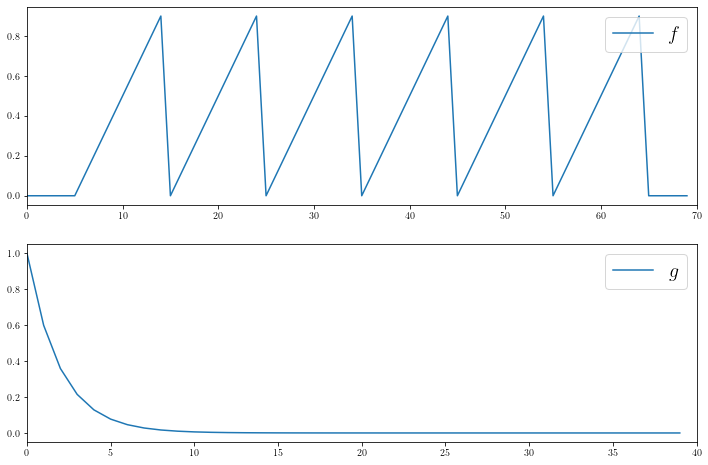

In [267]:
# create the signal for the force
x = force(cycles=6, amplitude=1, period=10)

# create the impulse response signal
h = impulse_response(40, scale=20) 

# for visualization purposes, pad the signal with extra zeros
x_padded = np.pad(x, 5)

# plot them both
fig, axes = plt.subplots(2, 1, figsize=(12,8))
_ = axes[0].plot(x_padded, label="$f$")
_ = axes[1].plot(h, label="$g$")
_ = axes[0].set_xlim(0, len(x_padded))
_ = axes[1].set_xlim(0, len(h))
_ = axes[0].legend(fontsize=20, loc='upper right')
_ = axes[1].legend(fontsize=20, loc='upper right')

In [268]:
# convolve and save gif
response = convolution_1d(x_padded, h)
plot_convolution(x_padded, h, response, filepath="figures/sliding_block.gif")

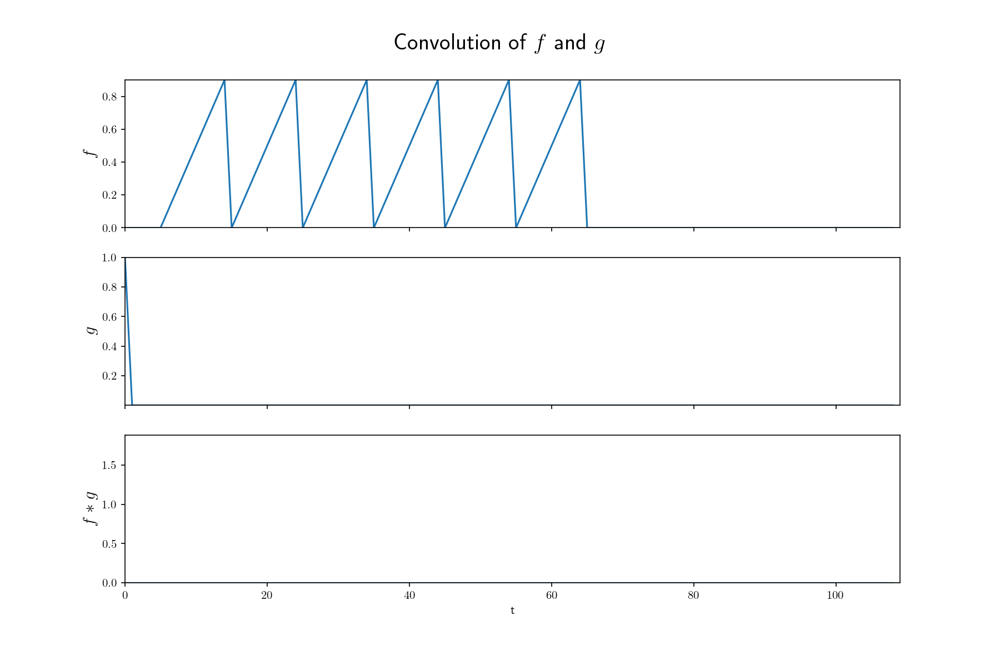

In [269]:
# display gif in notebook
with open('figures/sliding_block.gif', 'rb') as f:
    gif_data = f.read()
display.Image(data=gif_data, format='png')

## Example 2: Convolution with a Gaussian

Now lets consider the case where $f, g$ are univariate signals with $g$ begin a gaussian, and $f$ is any random signal. 

In [34]:
def gaussian_signal(n, dmin=-1, dmax=1, mean=0, std=1):
    """Returns a Gaussian signal 
    
    Args:
        n (int): number of samples
        dmin (float): minimum of the signal domain
        dmax (float): maximum of the signal domain
        mean (float): mean of the gaussian
        std (float): standard deviation of the gaussian
    """
    x = np.linspace(dmin, dmax, n)
    return np.exp(-0.5 * ((x - mean) / std)**2) / np.sqrt(2 * np.pi * std**2)

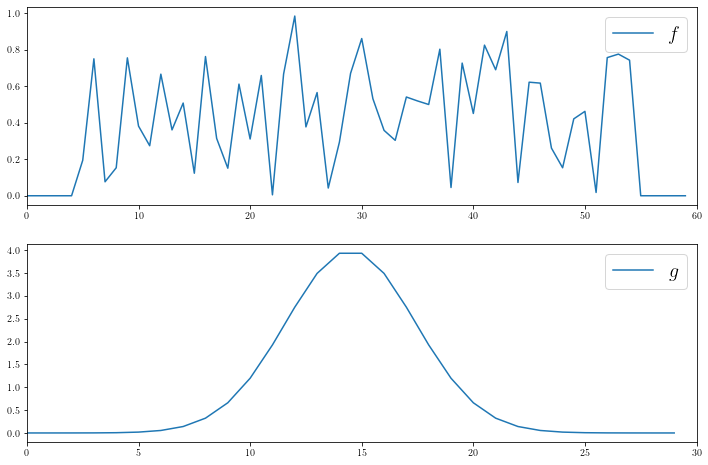

In [276]:
# create a random signal for f
f = np.random.rand(50)

# create a gaussian signal for g
g = gaussian_signal(30, dmin=-0.5, dmax=0.5, std=0.1)

# for visualization purposes, pad the signal with extra zeros
f_padded = np.pad(f, 5)

# plot them both
fig, axes = plt.subplots(2, 1, figsize=(12,8))
_ = axes[0].plot(f_padded, label="$f$")
_ = axes[1].plot(g, label="$g$")
_ = axes[0].set_xlim(0, len(f_padded))
_ = axes[1].set_xlim(0, len(g))
_ = axes[0].legend(fontsize=20, loc='upper right')
_ = axes[1].legend(fontsize=20, loc='upper right')

In [277]:
# convolve and save gif
response = convolution_1d(f_padded, g)
plot_convolution(f_padded, g, response, filepath="figures/conv1d.gif")

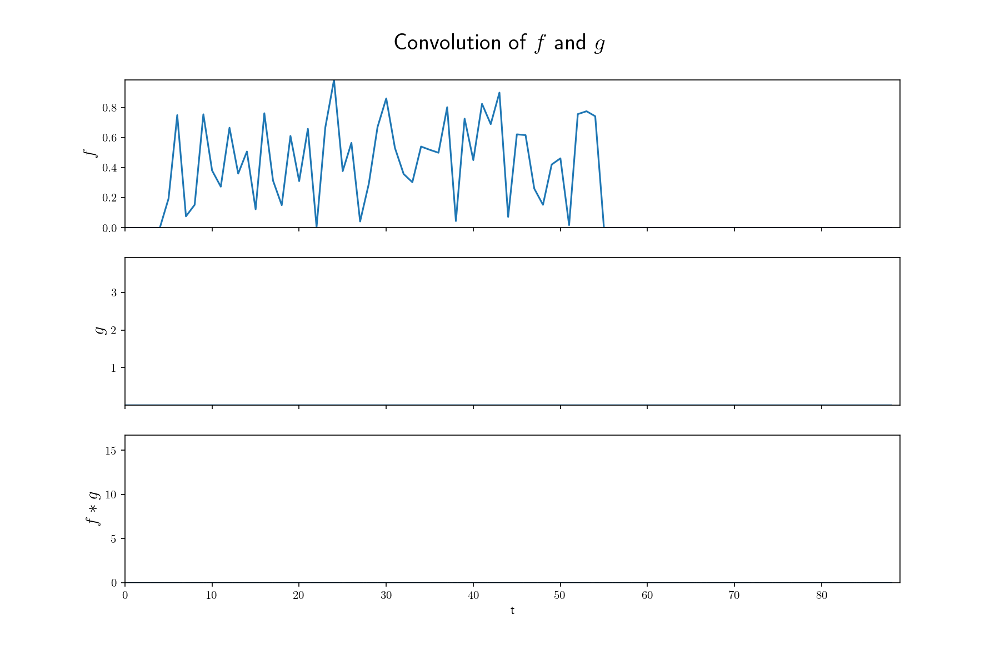

In [278]:
# display gif in notebook
with open('figures/conv1d.gif', 'rb') as f:
    gif_data = f.read()
display.Image(data=gif_data, format='png')

We can now see that convolving a signal with a gaussian has a smoothing effect on the signal! In the next section on 2D convolutions, we will introduce the notion of a *filter* or *kernel* which are commonly used in image processing to modify images in many different ways.

# 2D Convolution

The convolution of two 2D signals $f$ and $g$ is defined as:

\begin{align*}
    (f*g)[i, j] = \sum_{k=-\infty}^\infty\sum_{l=-\infty}^\infty f[k, l]g[i-k, j-l]
\end{align*}

Clearly, it is very similar to the definition of a 1D discrete convolution, with the addition of another dimension to sum over.

In image processing, applying filters to an image can produce useful effects such as blurring, sharpening, or even edge detecting. This is often expressed as an image being convolved with a *filter* or *kernel* which is usually of smaller dimensions than the image:
![](https://media5.datahacker.rs/2018/11/conv_3_neg30.png)
<p style="text-align: center;">Figure 3: Example of an edge detecting kernel</p>


#### Important Parameters
Now is a good time to define a few terms that we didn't cover in the 1D case:
- Stride : The number of steps the kernel advances in a direction (in the 1D case, the stride was implicitly set as 1)
- Padding : The 'filler' values surrounding the boundary of a signal
- Kernel Size: The dimensions of the kernel or filter (in the 1D case, this was just the length of $g$)

#### Remarks on Padding

In the 1D case, we padded our signals on the left and right so that they were the same length, and so the convolution was effectively sliding one signal rightward over the other until they lined up. In general, you can pad your signals anyway you want, and it is common to pad evenly around the signals especially in the image processing context. There are three common padding modes:

Full - One signal is padded so that every possible intersection of the signal against the other is possible (this is what we did in the 1D case)

Valid - The convolution is only computed where the signals fully overlap

Same - One signal is padded so that the output dimensions is the same as the signal with the largest dimensions (e.g. the output is the same size as the image)

| Full Padding | Valid Padding | Same Padding |
|:-:|:-:|:-:|
|<img width="195" src="http://deeplearning.net/software/theano_versions/dev/_images/full_padding_no_strides.gif"> | <img width="200" src="http://deeplearning.net/software/theano_versions/dev/_images/full_padding_no_strides_transposed.gif">|<img width="200" src="https://miro.medium.com/max/790/1*1okwhewf5KCtIPaFib4XaA.gif">|

The visualizations above were taken from this [in-depth guide](http://deeplearning.net/software/theano_versions/dev/tutorial/conv_arithmetic.html#) that explains everything you need to know about 2D discrete convolutions.


#### Output Shape Formula

Now how are you supposed to know how much to pad for the full or same padding mode? In the `convolution_1d` function above, how did we know how to compute the `length` of the output signal? It turns out there is a very handy formula for computing the output shape of a convolution given by:

$$\text{output size} = \left\lfloor \frac{\text{input size} + 2\times\text{padding} - \text{kernel size}}{\text{stride}} \right\rfloor + 1$$

The nice thing about this formula is that it applies to each dimension of a signal *independently*. For example, if you want to know how to pad an image so that the output size of a convolution between the image and an edge detecting filter is the same as the image's dimensions, then for the height and width dimensions, set $\text{input}=\text{output}$ and solve for $\text{padding}$. This formula even applies to N-dimensional convolutions on N-dimensional signals.

In [6]:
def conv_output_shape(i, p, k, s):
    """Computes the output shape of a convolution between
       signals along a single dimension
    
    Args:
        i (int): input shape
        p (int): amount of padding 
        k (int): kernel size
        s (int): stride
    """
    return (i + 2 * p - k) // s + 1

def convolution_2d(f, g, stride=1, mode='same'):
    """Computes a 2D discrete convolution over two signals f and g
    
    Args:
        f (np.ndarray): one of the signals
        g (np.ndarray): the other signal
        stride (int or 2-tuple[int]): filter steps in each direction
        mode (string): type of padding to use
    """
    # input shape
    in_shape = f.shape
    
    # stride in each direction
    if isinstance(stride, tuple):
        assert len(stride) == 2, "Stride must be either an integer or 2-tuple"
    s = (stride, stride) if isinstance(stride, int) else stride
    
    # flip kernel, otherwise this would be cross-correlation
    g_flipped = np.fliplr(np.flipud(g))
    ks = g.shape
    
    # padding the input and compute the output shape
    assert mode in ["full", "same", "valid"], "Padding mode must be one of ['full', 'same', 'valid']"
    if mode == "full":
        height_pad = ks[0] - 1
        width_pad = ks[1] - 1
        f_padded = np.pad(f, ((height_pad,), (width_pad,)))
    elif mode == "valid":  ## do nothing
        height_pad = 0
        width_pad = 0
        f_padded = f
    elif mode == "same":  ## padding computed via output shape formula
        height_pad = (s[0] * (in_shape[0] - 1) - in_shape[0] + ks[0]) // 2
        width_pad = (s[1] * (in_shape[1] - 1) - in_shape[1] + ks[1]) // 2
        
        f_padded = np.pad(f, ((height_pad,), (width_pad,)))
        
    # output shape
    output_shape = (
        conv_output_shape(in_shape[0], height_pad, ks[0], s[0]), 
        conv_output_shape(in_shape[1], width_pad, ks[1], s[1])
    )
    
    # initialize response
    response = np.zeros(output_shape)
        
    # perform the convolution
    for i in range(0, f_padded.shape[0] - ks[0] + 1, stride):
        for j in range(0, f_padded.shape[1] - ks[1] + 1, stride):
            
            # get window of f that g 'looks' at
            window = f_padded[i: i + ks[0], j: j + ks[1]]
            ws = window.shape
            
            # handle kernel stepping out of bounds
            kernel = g_flipped[:ws[0], :ws[1]] if ks != window.shape else g_flipped
            
            response[i, j] = np.sum(window * kernel)

    return response
    

In [23]:
def visualize_conv2d(img, kernel, response):
    """Visualizes the convolution of an image with a kernel
    """
    fig, axes = plt.subplots(
        nrows=1, 
        ncols=3, 
        gridspec_kw={
            'width_ratios': [4, 1, 4]
        },
        figsize=(10, 5)
    )
    plt.rcParams['image.cmap'] = 'bone'
        
    # plot images
    axes[0].set_title("Original Image")
    axes[0].imshow(img)
    axes[0].axis('off')
    
    axes[1].set_title("Filter")
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    axes[1].imshow(kernel, vmin=min(kernel.min(), 0), vmax=kernel.max())
    
    axes[2].set_title("Filtered Image")
    axes[2].imshow(response)
    axes[2].axis('off')
    
    plt.show()
    plt.close()

## Example 3: Image Processing

TODO: add a whole bunch of words

In [24]:
# define some filters!

# identity
delta = UnitImpulse(size=3)

# blurring
boxblur = BoxBlur(size=3)
gaussblur = GaussianBlur(size=5)

# edge detectors
prewitt_vert = PrewittEdge("vert")
prewitt_horiz = PrewittEdge("horiz")
prewitt_ldiag = PrewittEdge("ldiag")
prewitt_rdiag = PrewittEdge("rdiag")

sobel_vert = SobelEdge("vert")
sobel_horiz = SobelEdge("horiz")
sobel_ldiag = SobelEdge("ldiag")
sobel_rdiag = SobelEdge("rdiag")

# high pass filters
highpass = HighPass()
laplace = Laplacian()

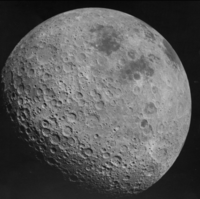

In [25]:
moon = Image.open("images/moon.png").convert("L")
display.Image("images/moon.png")

In [26]:
moon_img = np.array(moon).astype(float) / 255.

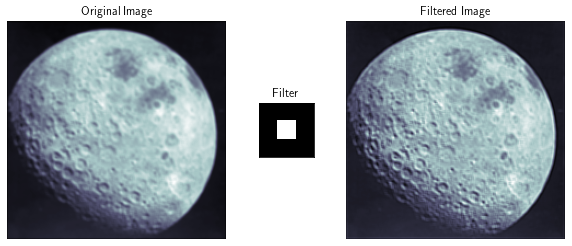

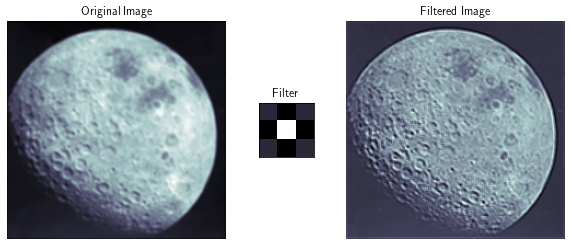

In [36]:
# image sharpening

# first intentionally blur the image to emphasize sharpening effect
blurred_moon = convolution_2d(moon_img, boxblur())

# extract high frequency features
high_pass_feats = convolution_2d(blurred_moon, highpass())

# sharpen the image
alpha = 1/4
sharpened_moon = blurred_moon + alpha * high_pass_feats

# do the same with the laplacian filter
beta = 2
laplace_feats = convolution_2d(blurred_moon, laplace())
sharpened_moon_laplace = blurred_moon + beta * laplace_feats

visualize_conv2d(blurred_moon, delta() + alpha * highpass(), sharpened_moon)
visualize_conv2d(blurred_moon, delta() + beta * laplace(), sharpened_moon_laplace)

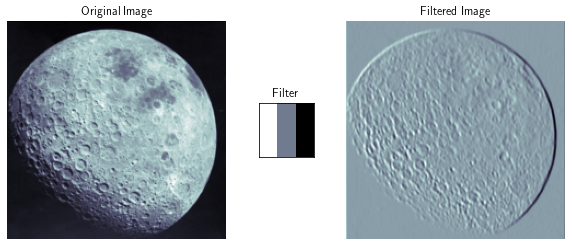

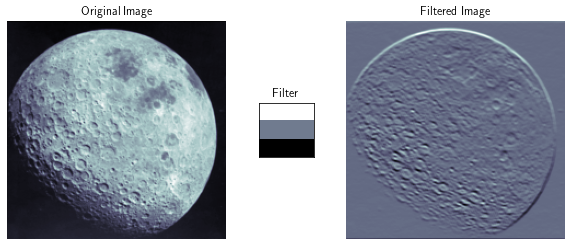

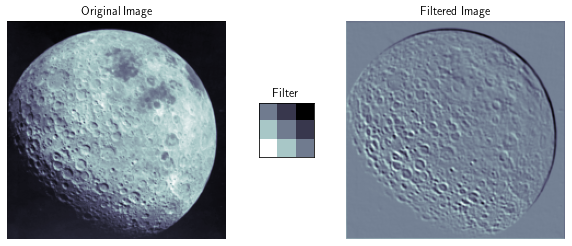

In [28]:
# prewitt edge detection
horiz_edged = convolution_2d(moon_img, prewitt_horiz())
vert_edged = convolution_2d(moon_img, prewitt_vert())
rdiag_edged = convolution_2d(moon_img, prewitt_rdiag())
visualize_conv2d(moon_img, prewitt_horiz(), horiz_edged)
visualize_conv2d(moon_img, prewitt_vert(), vert_edged)
visualize_conv2d(moon_img, prewitt_rdiag(), rdiag_edged)

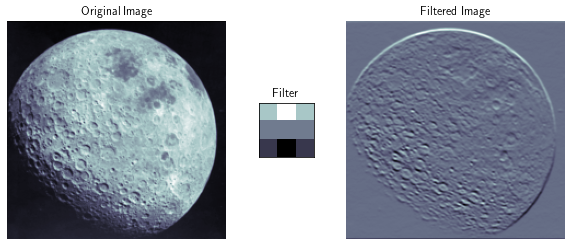

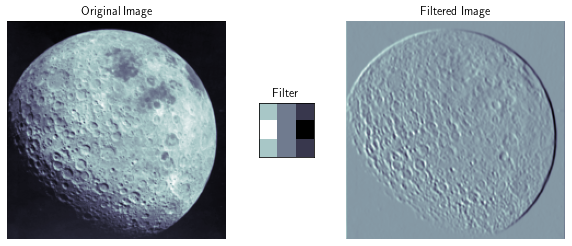

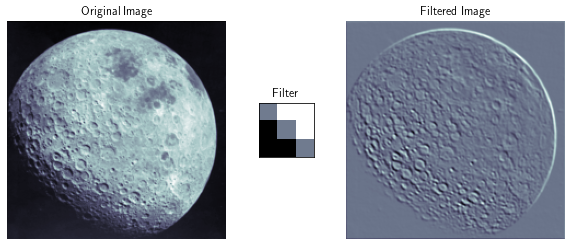

In [29]:
# sobel filter edge detection
sobel_xed = convolution_2d(moon_img, sobel_horiz())
sobel_yed = convolution_2d(moon_img, sobel_vert())
sobel_diaged = convolution_2d(moon_img, sobel_rdiag())

visualize_conv2d(moon_img, sobel_horiz(), sobel_xed)
visualize_conv2d(moon_img, sobel_vert(), sobel_yed)
visualize_conv2d(moon_img, sobel_rdiag(), sobel_diaged)

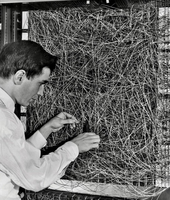

In [30]:
mark1 = Image.open("images/mark1.png").convert("L")
display.Image("images/mark1.png")

In [31]:
mark1_img = np.array(mark1).astype(float) / 255.

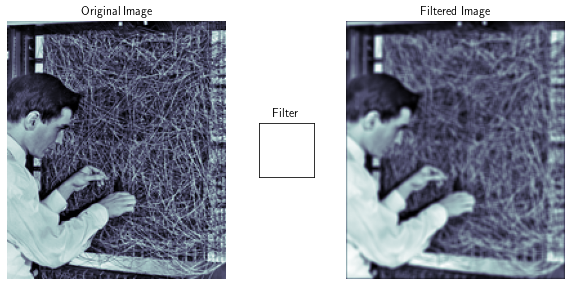

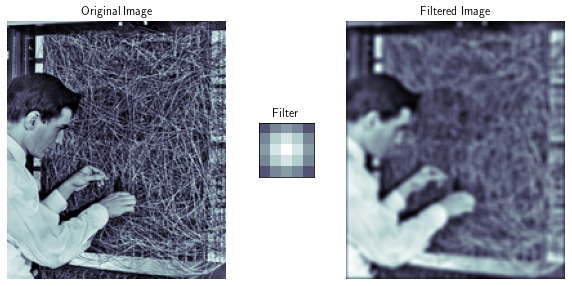

In [32]:
# blurring
box_blurred = convolution_2d(mark1_img, boxblur())
gaussian_blurred = convolution_2d(mark1_img, gaussblur())
visualize_conv2d(mark1_img, boxblur(), box_blurred)
visualize_conv2d(mark1_img, gaussblur(), gaussian_blurred)